In [1]:
import os
import shutil
import cv2
import math
import random
import numpy as np
import tensorflow as tf
from tensorflow import keras
from collections import deque
import matplotlib.pyplot as plt
plt.style.use("seaborn")

%matplotlib inline

from sklearn.model_selection import train_test_split

from keras.layers import *
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model
from keras.applications.mobilenet_v2 import MobileNetV2

from IPython.display import HTML
from base64 import b64encode

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/tmp/ipykernel_42/2690894861.py:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


In [2]:
def Play_Video(filepath):
    html = ''
    video = open(filepath, 'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src
    return HTML(html)

In [3]:
NonViolnceVideos_Dir = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/"
ViolnceVideos_Dir = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/"

In [4]:
NonViolence_files_names_list = os.listdir(NonViolnceVideos_Dir)
Violence_files_names_list = os.listdir(ViolnceVideos_Dir)

In [5]:
Random_NonViolence_Video = random.choice(NonViolence_files_names_list)
Random_Violence_Video = random.choice(Violence_files_names_list)

In [6]:
Play_Video(f"{NonViolnceVideos_Dir}/{Random_NonViolence_Video}")

In [7]:
Play_Video(f"{ViolnceVideos_Dir}/{Random_Violence_Video}")

In [8]:
IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64
SEQUENCE_LENGTH = 16

In [9]:
DATASET_DIR = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/"

In [10]:
CLASSES_LIST = ["NonViolence", "Violence"]

In [11]:
def frames_extraction(video_path):
    frames_list = []
    video_reader = cv2.VideoCapture(video_path)
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read()

        if not success:
            break

        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
        frames_list.append(normalized_frame)

    video_reader.release()
    return frames_list

In [12]:
def create_dataset():
    features = []
    labels = []
    video_files_paths = []

    for class_index, class_name in enumerate(CLASSES_LIST):
        print(f'Extracting Data of Class: {class_name}')
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))

        for file_name in files_list:
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)
            frames = frames_extraction(video_file_path)

            if len(frames) == SEQUENCE_LENGTH:
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    features = np.asarray(features)
    labels = np.array(labels)

    return features, labels, video_files_paths

In [13]:
features, labels, video_files_paths = create_dataset()
np.save("features.npy", features)
np.save("labels.npy", labels)
np.save("video_files_paths.npy", video_files_paths)

Extracting Data of Class: NonViolence


[h264 @ 0x5ad4bdce8800] mb_type 104 in P slice too large at 98 31
[h264 @ 0x5ad4bdce8800] error while decoding MB 98 31
[h264 @ 0x5ad4bdce8800] mb_type 104 in P slice too large at 98 31
[h264 @ 0x5ad4bdce8800] error while decoding MB 98 31
[h264 @ 0x5ad4bdce8800] mb_type 104 in P slice too large at 98 31
[h264 @ 0x5ad4bdce8800] error while decoding MB 98 31
[h264 @ 0x5ad4bdce8800] mb_type 104 in P slice too large at 98 31
[h264 @ 0x5ad4bdce8800] error while decoding MB 98 31


Extracting Data of Class: Violence


In [14]:
features, labels, video_files_paths = np.load("features.npy"), np.load("labels.npy"), np.load("video_files_paths.npy")

In [15]:
one_hot_encoded_labels = to_categorical(labels)
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size=0.1,
                                                                            shuffle=True, random_state=42)

In [16]:
print(features_train.shape, labels_train.shape)
print(features_test.shape, labels_test.shape)

(1800, 16, 64, 64, 3) (1800, 2)
(200, 16, 64, 64, 3) (200, 2)


In [17]:
mobilenet = MobileNetV2(include_top=False, weights="imagenet")
mobilenet.trainable = True

9406464/9406464 [==============================] - 0s 0us/step


In [18]:
for layer in mobilenet.layers[:-40]:
    layer.trainable = False

In [19]:
def create_model():
    model = Sequential()
    model.add(Input(shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(TimeDistributed(mobilenet))
    model.add(Dropout(0.25))
    model.add(TimeDistributed(Flatten()))

    lstm_fw = LSTM(units=32)
    lstm_bw = LSTM(units=32, go_backwards=True)
    model.add(Bidirectional(lstm_fw, backward_layer=lstm_bw))

    model.add(Dropout(0.25))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(len(CLASSES_LIST), activation='softmax'))

    model.summary()
    return model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDist  (None, 16, 2, 2, 1280)    2257984   
 ributed)                                                        
                                                                 
 dropout (Dropout)           (None, 16, 2, 2, 1280)    0         
                                                                 
 time_distributed_1 (TimeDi  (None, 16, 5120)          0         
 stributed)                                                      
                                                                 
 bidirectional (Bidirection  (None, 64)                1319168   
 al)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                        

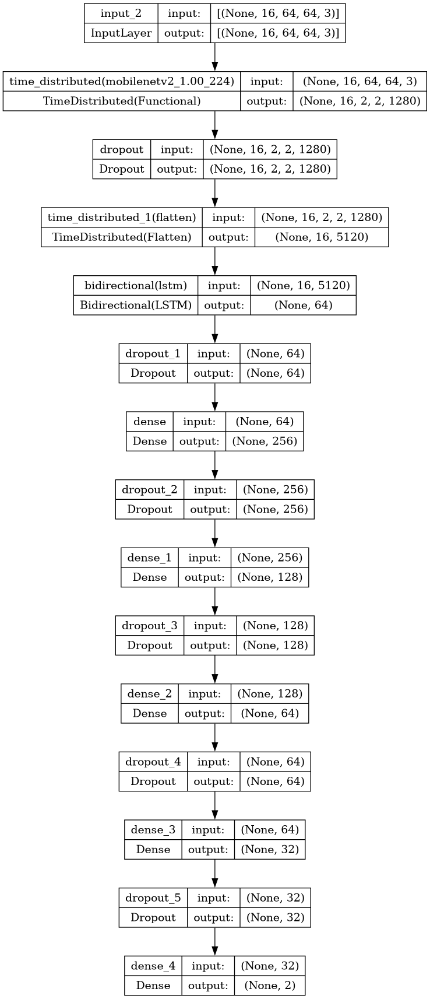

In [20]:
MoBiLSTM_model = create_model()
plot_model(MoBiLSTM_model, to_file='MobBiLSTM_model_structure_plot.png', show_shapes=True, show_layer_names=True)

In [21]:
early_stopping_callback = EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.6, patience=5, min_lr=0.00005, verbose=1)

In [22]:
MoBiLSTM_model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=["accuracy"])
MobBiLSTM_model_history = MoBiLSTM_model.fit(x=features_train, y=labels_train, epochs=40, batch_size=8,
                                             shuffle=True, validation_split=0.2,
                                             callbacks=[early_stopping_callback, reduce_lr])


Epoch 1/40
180/180 [==============================] - 25s 72ms/step - loss: 0.6958 - accuracy: 0.5125 - val_loss: 0.6894 - val_accuracy: 0.5306 - lr: 0.0100
Epoch 2/40
180/180 [==============================] - 10s 57ms/step - loss: 0.6899 - accuracy: 0.5368 - val_loss: 0.6884 - val_accuracy: 0.5639 - lr: 0.0100
Epoch 3/40
180/180 [==============================] - 10s 57ms/step - loss: 0.6812 - accuracy: 0.5667 - val_loss: 0.6633 - val_accuracy: 0.6639 - lr: 0.0100
Epoch 4/40
180/180 [==============================] - 10s 57ms/step - loss: 0.6486 - accuracy: 0.6215 - val_loss: 0.5761 - val_accuracy: 0.7472 - lr: 0.0100
Epoch 5/40
180/180 [==============================] - 10s 57ms/step - loss: 0.5369 - accuracy: 0.7583 - val_loss: 0.4190 - val_accuracy: 0.8278 - lr: 0.0100
Epoch 6/40
180/180 [==============================] - 10s 57ms/step - loss: 0.4341 - accuracy: 0.8229 - val_loss: 0.3379 - val_accuracy: 0.8500 - lr: 0.0100
Epoch 7/40
180/180 [==============================] - 10s 

In [23]:
model_evaluation_history = MoBiLSTM_model.evaluate(features_test, labels_test)

7/7 [==============================] - 4s 59ms/step - loss: 0.2472 - accuracy: 0.9250


In [24]:
MoBiLSTM_model.save("Violance_Detection.h5")

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [25]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    epochs = range(len(metric_value_1))

    plt.plot(epochs, metric_value_1, 'blue', label=metric_name_1)
    plt.plot(epochs, metric_value_2, 'orange', label=metric_name_2)
    plt.title(str(plot_name))
    plt.legend()

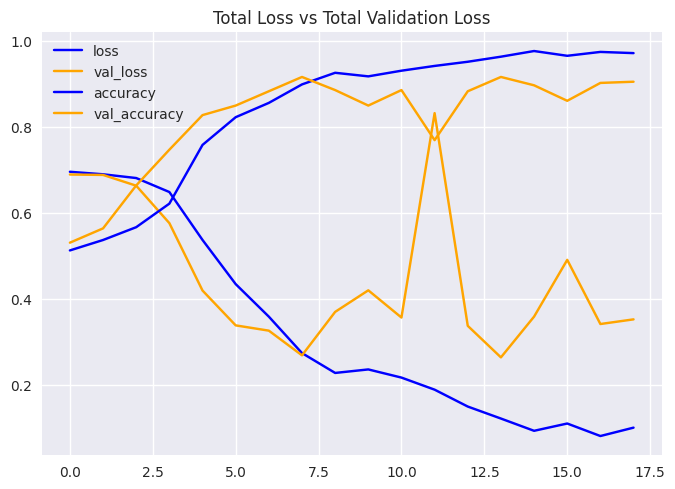

In [26]:
plot_metric(MobBiLSTM_model_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')
plot_metric(MobBiLSTM_model_history, 'accuracy', 'val_accuracy', 'Total Loss vs Total Validation Loss')

In [27]:
labels_predict = MoBiLSTM_model.predict(features_test)
labels_predict = np.argmax(labels_predict, axis=1)
labels_test_normal = np.argmax(labels_test, axis=1)

7/7 [==============================] - 2s 59ms/step


In [28]:
from sklearn.metrics import accuracy_score

AccScore = accuracy_score(labels_predict, labels_test_normal)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.925


[Text(0, 0.5, 'NonViolence'), Text(0, 1.5, 'Violence')]

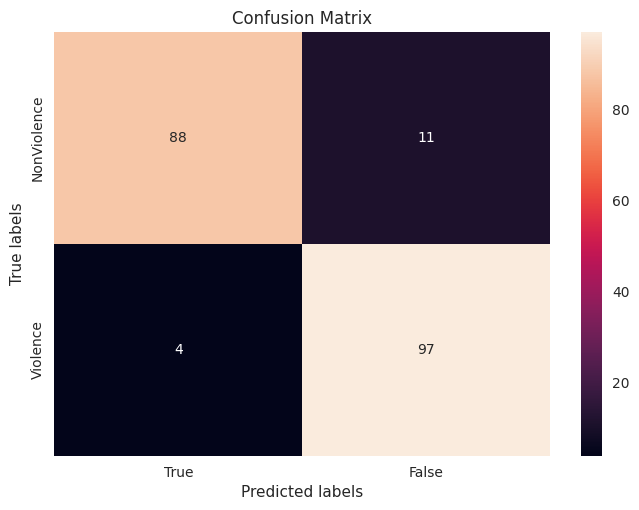

In [29]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

ax = plt.subplot()
cm = confusion_matrix(labels_test_normal, labels_predict)
sns.heatmap(cm, annot=True, fmt='g', ax=ax)
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['True', 'False'])
ax.yaxis.set_ticklabels(['NonViolence', 'Violence'])

In [30]:
from sklearn.metrics import classification_report

ClassificationReport = classification_report(labels_test_normal, labels_predict)
print('Classification Report is : \n', ClassificationReport)

Classification Report is : 
               precision    recall  f1-score   support

           0       0.96      0.89      0.92        99
           1       0.90      0.96      0.93       101

    accuracy                           0.93       200
   macro avg       0.93      0.92      0.92       200
weighted avg       0.93      0.93      0.92       200



In [31]:
def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):
    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'),
                                   video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
    frames_queue = deque(maxlen=SEQUENCE_LENGTH)
    predicted_class_name = ''

    while video_reader.isOpened():
        ok, frame = video_reader.read()

        if not ok:
            break

        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
        frames_queue.append(normalized_frame)

        if len(frames_queue) == SEQUENCE_LENGTH:
            predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_queue, axis=0))[0]
            predicted_label = np.argmax(predicted_labels_probabilities)
            predicted_class_name = CLASSES_LIST[predicted_label]

        if predicted_class_name == "Violence":
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)
        else:
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 12)

        video_writer.write(frame)

    video_reader.release()
    video_writer.release()

plt.style.use("default")

In [32]:
def show_pred_frames(pred_video_path):
    plt.figure(figsize=(20, 15))
    video_reader = cv2.VideoCapture(pred_video_path)
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    random_range = sorted(random.sample(range(SEQUENCE_LENGTH, frames_count), 12))

    for counter, random_index in enumerate(random_range, 1):
        plt.subplot(5, 4, counter)
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)
        ok, frame = video_reader.read()

        if not ok:
            break

        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame)
        ax.figure.set_size_inches(20, 20)
        plt.tight_layout()

    video_reader.release()

In [33]:
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)
output_video_file_path = f'{test_videos_directory}/Output-Test-Video.mp4'

1/1 [==============================] - 0s 24ms/step


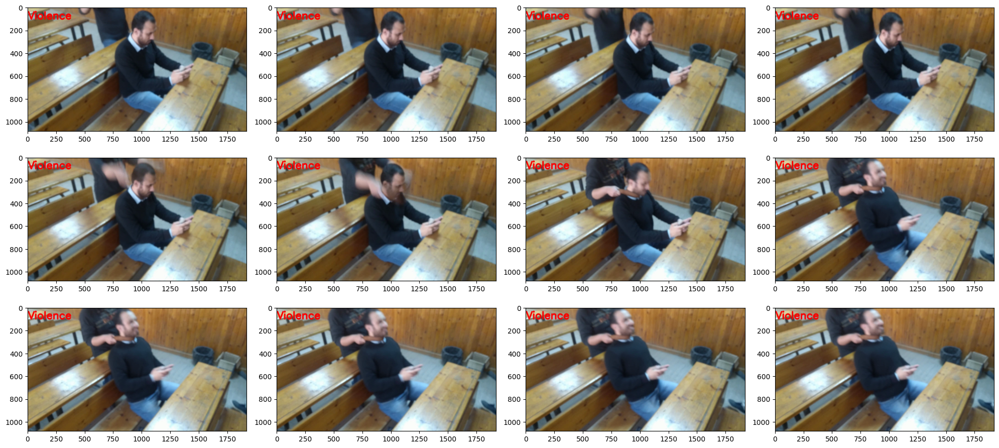

In [34]:
input_video_file_path = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_10.mp4"
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)
show_pred_frames(output_video_file_path)
Play_Video(input_video_file_path)

1/1 [==============================] - 0s 24ms/step


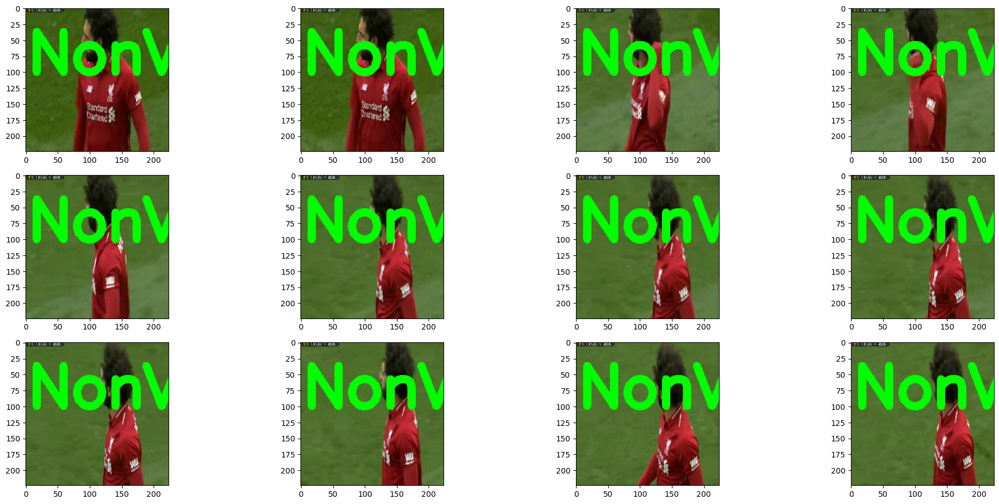

In [35]:
input_video_file_path = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_120.mp4"
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)
show_pred_frames(output_video_file_path)
Play_Video(input_video_file_path)

In [36]:
def predict_video(video_file_path, SEQUENCE_LENGTH):
    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frames_list = []
    predicted_class_name = ''
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read()

        if not success:
            break

        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
        frames_list.append(normalized_frame)

    predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_list, axis=0))[0]
    predicted_label = np.argmax(predicted_labels_probabilities)
    predicted_class_name = CLASSES_LIST[predicted_label]

    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')

    video_reader.release()

In [37]:
!pip install pytube



  Obtaining dependency information for pytube from https://files.pythonhosted.org/packages/51/64/bcf8632ed2b7a36bbf84a0544885ffa1d0b4bcf25cc0903dba66ec5fdad9/pytube-15.0.0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 868.7 kB/s eta 0:00:000:00:01


In [38]:

from pytube import YouTube

In [39]:
def predict_video_from_url(video_url, sequence_length=16):
    try:
        # Get YouTube video details using pytube
        youtube_video = YouTube(video_url)
        video_stream = youtube_video.streams.filter(file_extension="mp4").first()
        video_stream_url = video_stream.url
        predict_frames(video_stream_url, output_video_file_path, sequence_length)
        show_pred_frames(output_video_file_path)


        # Perform prediction on the video
        predict_video(video_stream_url, sequence_length)

    except Exception as e:
        print(f"Error: {e}")

1/1 [==============================] - 0s 23ms/step


[tls @ 0x5ad54455f1c0] IO error: Connection reset by peer
[tls @ 0x5ad54455f1c0] IO error: End of file
[https @ 0x5ad4df1a1440] Stream ends prematurely at 5560760, should be 5618818


1/1 [==============================] - 0s 23ms/step


[mov,mp4,m4a,3gp,3g2,mj2 @ 0x5ad5437415c0] stream 1, offset 0x54db1f: partial file


1/1 [==============================] - 0s 30ms/step
Predicted: Violence
Confidence: 0.9295874238014221


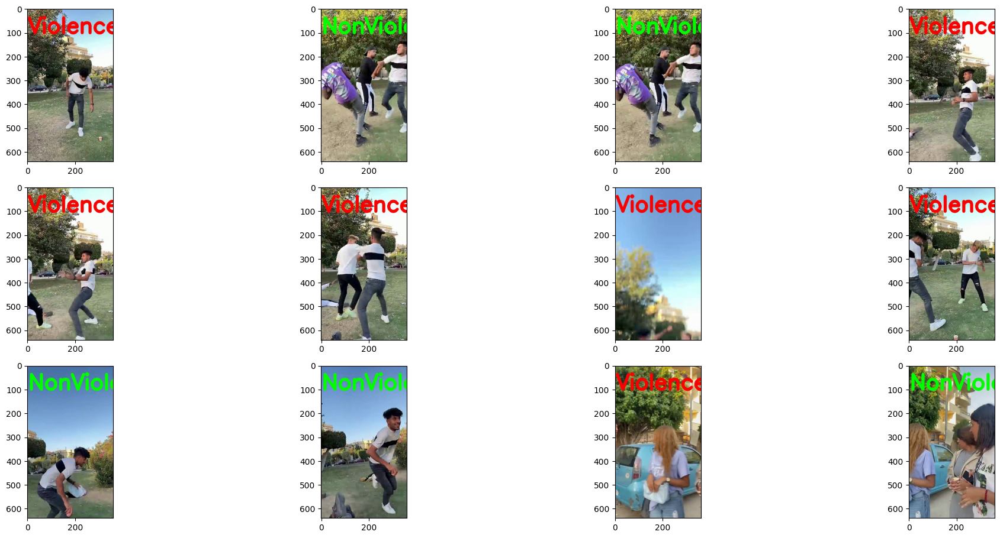

In [40]:
# Test the user video URL prediction function
user_video_url ="https://youtube.com/shorts/f4WsfLQF6VY?si=Y8xE9xoNM7hhIwXo"
predict_video_from_url(user_video_url)

1/1 [==============================] - 0s 27ms/step
Predicted: NonViolence
Confidence: 0.6470304131507874


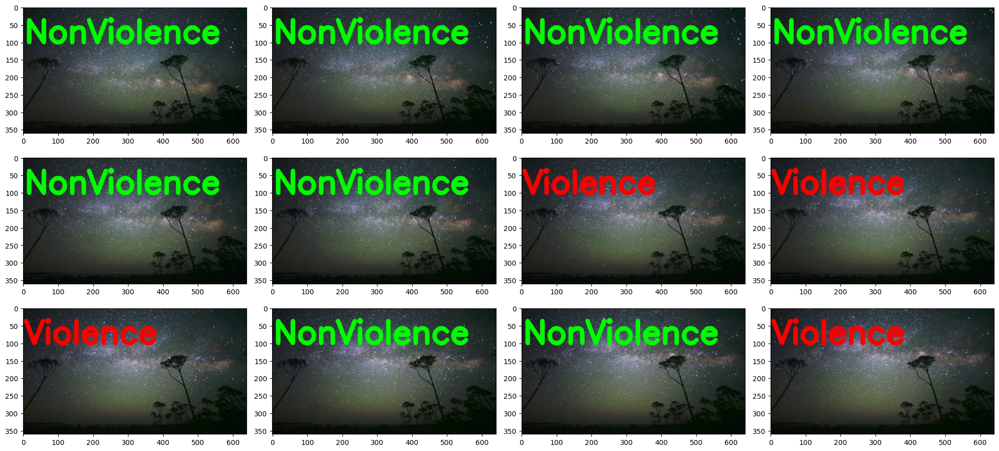

In [41]:
# Test the user video URL prediction function
user_video_url = "https://www.youtube.com/watch?v=QC8iQqtG0hg&pp=ygUPNSBzZWNvbmRzIHZpZGVv"
predict_video_from_url(user_video_url)

1/1 [==============================] - 0s 25ms/step


[tls @ 0x5ad5427de340] IO error: Connection reset by peer
[tls @ 0x5ad5427de340] IO error: End of file
[https @ 0x5ad53c2dcb40] Stream ends prematurely at 4196364, should be 4945198


1/1 [==============================] - 0s 25ms/step


[mov,mp4,m4a,3gp,3g2,mj2 @ 0x5ad4f19df280] stream 0, offset 0x401f3c: partial file


1/1 [==============================] - 0s 32ms/step
Predicted: Violence
Confidence: 0.9297352433204651


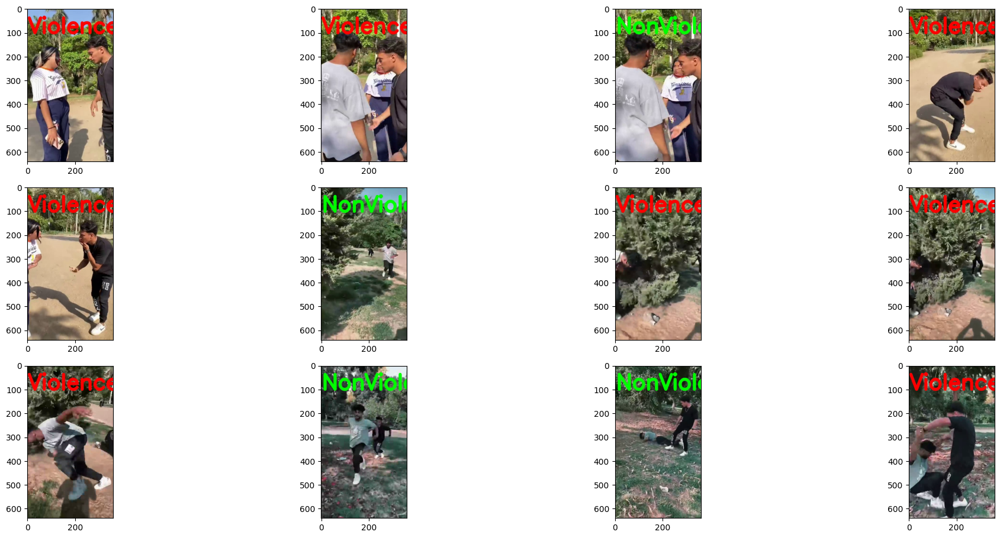

In [42]:
# Test the user video URL prediction function
user_video_url = "https://youtube.com/shorts/IGkIbbwqvRI?si=xySA3AJe5FYG4dZP"
predict_video_from_url(user_video_url)

1/1 [==============================] - 0s 23ms/step


[tls @ 0x5ad4d4657a80] IO error: Connection reset by peer
[tls @ 0x5ad4d4657a80] IO error: End of file
[https @ 0x5ad4d78e0440] Stream ends prematurely at 685130, should be 1243644


1/1 [==============================] - 0s 24ms/step


[mov,mp4,m4a,3gp,3g2,mj2 @ 0x5ad4d7a0a900] stream 0, offset 0xa75ac: partial file


1/1 [==============================] - 0s 26ms/step
Predicted: Violence
Confidence: 0.9878809452056885


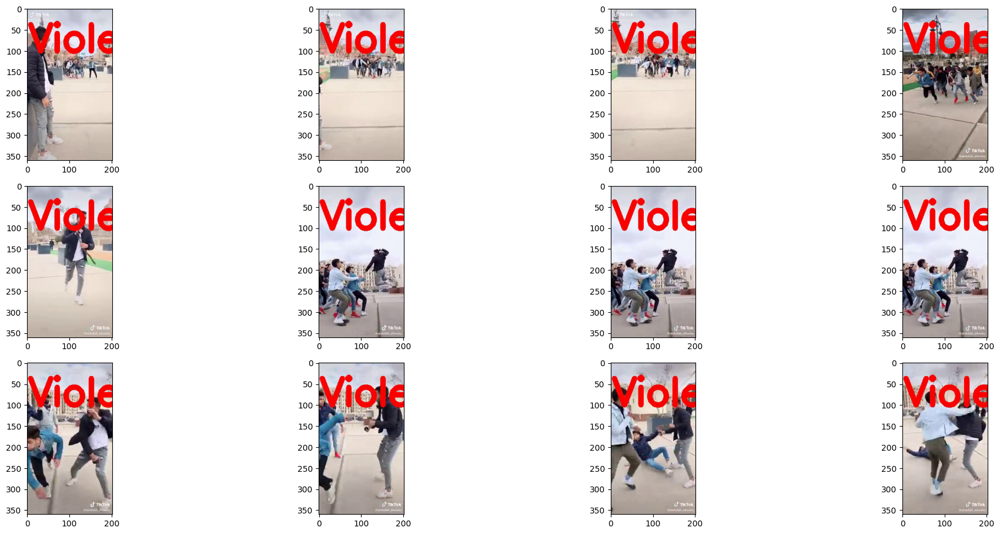

In [43]:

# Test the user video URL prediction function
user_video_url = "https://youtube.com/shorts/gbWl0J6oOvY?si=dE1S82q64OKVr5RV"
predict_video_from_url(user_video_url)

In [44]:
import numpy as np
from keras.models import load_model

In [45]:
# Constants
IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64
SEQUENCE_LENGTH = 16
THRESHOLD_CONSECUTIVE_FRAMES = 5
CLASSES_LIST = ["NonViolence", "Violence"]

In [46]:
# Load the trained model
model = load_model("/kaggle/working/Violance_Detection.h5")

In [47]:
def detect_violence_realtime(model, sequence_length=SEQUENCE_LENGTH):
    # Open a connection to the default camera (0)
    cap = cv2.VideoCapture(0)

    # Variable to keep track of consecutive frames classified as violence
    violence_counter = 0
    frames_queue = []

    while True:
        # Capture frame-by-frame
        ret, frame = cap.read()

        # Resize the frame to match the input size of your model
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Preprocess the frame
        normalized_frame = resized_frame / 255

        # Add the frame to the frames queue
        frames_queue.append(normalized_frame)

        # If the frames queue has reached the sequence length, make a prediction
        if len(frames_queue) == sequence_length:
            # Predict the class label
            frames_array = np.array(frames_queue)
            frames_array = np.expand_dims(frames_array, axis=0)
            predicted_labels_probabilities = model.predict(frames_array)[0]
            predicted_label = np.argmax(predicted_labels_probabilities)
            predicted_class_name = CLASSES_LIST[predicted_label]

            # If violence is detected, increment the violence counter
            if predicted_class_name == "Violence":
                violence_counter += 1
            else:
                violence_counter = 0

            # If violence has been detected for a certain number of consecutive frames, take action
            if violence_counter >= THRESHOLD_CONSECUTIVE_FRAMES:
                # Perform the desired action (e.g., alerting authorities)
                print("Violence detected! Take action.")

                # Reset the violence counter
                violence_counter = 0

            # Remove the oldest frame from the queue
            frames_queue.pop(0)

        # Display the frame
        cv2.imshow('Real-time Violence Detection', frame)

        # If 'q' is pressed, break from the loop
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    # Release the camera and close all OpenCV windows
    cap.release()
    cv2.destroyAllWindows()